In [1]:
%%capture
!pip install nussl
!pip install git+https://github.com/source-separation/tutorial

In [2]:
import nussl
from IPython.display import Audio
import IPython
from common import viz

c:\users\satyam\appdata\local\programs\python\python39\lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
SoX could not be found!

    If you do not have SoX, proceed here:
     - - - http://sox.sourceforge.net/ - - -

    If you do (or think that you should) have SoX, double-check your
    path variables.
    


In [3]:
# Run this command to download X 7-second clips from MUSDB18
musdb = nussl.datasets.MUSDB18(download=True)

Done!


In [4]:
musdb_train = nussl.datasets.MUSDB18(subsets=['train'])

In [5]:
print(musdb_train.items)

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93]


In [6]:
idx = 0
item = musdb_train[idx]
item.keys()

dict_keys(['mix', 'sources', 'metadata'])

In [7]:
item['metadata']

{'labels': ['bass', 'drums', 'other', 'vocals']}

In [8]:
item['sources'].keys()

dict_keys(['drums', 'bass', 'other', 'vocals'])

In [9]:
Audio(data=item['mix'].audio_data, rate=item['mix'].sample_rate)

In [27]:
for stem_label in item['sources'].keys():
    print(stem_label)
    audio_player = Audio(data=item['sources'][stem_label].audio_data, rate=item['sources'][stem_label].sample_rate)
    IPython.display.display(audio_player)

drums


bass


other


vocals


In [14]:
import matplotlib.pyplot as plt

In [19]:
import librosa.display
plt.figure(figsize=(12,4))
print(type(item))


<class 'dict'>


<Figure size 1200x400 with 0 Axes>

In [20]:
musdb_train

In [28]:
print(type(Audio))

<class 'type'>


In [30]:
!pip install scraper

  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
  Created wheel for scraper: filename=scraper-0.1.0-py3-none-any.whl size=3494 sha256=35ce5088e5f020ddc5b72601b63f081ef41cd9aa01282514acae52509b0c640c
  Stored in directory: c:\users\satyam\appdata\local\pip\cache\wheels\fd\d1\ed\526df15c97e86d4e59a7ba61a03cff2b0ea709cc315d0dcb71
Successfully built scraper



[notice] A new release of pip is available: 23.0.1 -> 23.1.2
[notice] To update, run: python.exe -m pip install --upgrade pip


In [31]:
from pathlib import Path

# create foreground folder
fg_folder = Path('~/.nussl/ismir2020-tutorial/foreground').expanduser()  
fg_folder.mkdir(parents=True, exist_ok=True)                             

# create background folder - we need to provide one even if we don't use it
bg_folder = Path('~/.nussl/ismir2020-tutorial/background').expanduser()
bg_folder.mkdir(parents=True, exist_ok=True)

In [32]:
# For each item (track) in the train set, iterate over its sources (stems),
# create a folder for the stem if it doesn't exist already (drums, bass, vocals, other) 
# and place the stem audio file in this folder, using the song name as the filename
for item in musdb_train:
    song_name = item['mix'].file_name
    for key, val in item['sources'].items():
        src_path = fg_folder / key 
        src_path.mkdir(exist_ok=True)
        src_path = str(src_path / song_name) + '.wav'
        val.write_audio_to_file(src_path)

In [33]:
import os
import glob

for folder in os.listdir(fg_folder):
    if folder[0] != '.':  # ignore system folders
        stem_files = os.listdir(os.path.join(fg_folder, folder))
        print(f"\n{folder}\tfolder contains {len(stem_files)} audio files:\n")
        for sf in sorted(stem_files)[:5]:
            print(f"\t\t{sf}")
        print("\t\t...")


bass	folder contains 94 audio files:

		A Classic Education - NightOwl.wav
		ANiMAL - Clinic A.wav
		ANiMAL - Easy Tiger.wav
		ANiMAL - Rockshow.wav
		Actions - Devil's Words.wav
		...

drums	folder contains 94 audio files:

		A Classic Education - NightOwl.wav
		ANiMAL - Clinic A.wav
		ANiMAL - Easy Tiger.wav
		ANiMAL - Rockshow.wav
		Actions - Devil's Words.wav
		...

other	folder contains 94 audio files:

		A Classic Education - NightOwl.wav
		ANiMAL - Clinic A.wav
		ANiMAL - Easy Tiger.wav
		ANiMAL - Rockshow.wav
		Actions - Devil's Words.wav
		...

vocals	folder contains 94 audio files:

		A Classic Education - NightOwl.wav
		ANiMAL - Clinic A.wav
		ANiMAL - Easy Tiger.wav
		ANiMAL - Rockshow.wav
		Actions - Devil's Words.wav
		...


In [34]:
import scaper

seed = 123 # integer or np.random.RandomState(<integer>)

sc = scaper.Scaper(
    duration=5.0,
    fg_path=str(fg_folder),
    bg_path=str(bg_folder),
    random_state=seed
)

In [39]:
sc.sr = 44100
sc.n_channels = 1
sc.ref_db = -20

In [40]:
labels = ['vocals', 'drums', 'bass', 'other']

for label in labels:
    sc.add_event(label=('const', label),                # set the label value explicitly using a constant
                 source_file=('choose', []),            # choose the source file randomly from all files in the folder
                 source_time=('uniform', 0, 7),         # sample the source (stem) audio starting at a time between 0-7
                 event_time=('const', 0),               # always add the stem at time 0 in the mixture
                 event_duration=('const', sc.duration), # set the stem duration to match the mixture duration
                 snr=('uniform', -5, 5),                # choose an SNR for the stem uniformly between -5 and 5 dB
                 pitch_shift=('uniform', -2, 2),        # apply a random pitch shift between -2 and 2 semitones
                 time_stretch=('uniform', 0.8, 1.2))    # apply a random time stretch between 0.8 (faster) and 1.2 (slower)

In [41]:
mixture_audio, mixture_jam, annotation_list, stem_audio_list = sc.generate()

c:\users\satyam\appdata\local\programs\python\python39\lib\site-packages\scaper\core.py:1478: ScaperWarning: vocals event duration (5.00) with stretch factor 1.14 gives 5.70 which is greater than the soundscape duration (5.00), changing to 4.39 (5.00 after time stretching)
  warnings.warn(
c:\users\satyam\appdata\local\programs\python\python39\lib\site-packages\scaper\core.py:1513: ScaperWarning: vocals source time tuple (uniform, 0, 7) could not be satisfied given source duration (6.80) and event duration (4.39), source time tuple changed to (uniform, 0, 2.416607193353477)
  warnings.warn(


ValueError: Invalid file_type. Must be one of []

In [42]:
%%capture
!pip install scaper
!pip install nussl
!pip install git+https://github.com/source-separation/tutorial

In [43]:
import torch
from torch import nn
import nussl
import numpy as np
import matplotlib.pyplot as plt
import gif
from IPython.display import display, Image
import tempfile
import copy
import tqdm

nussl.utils.seed(0)
to_numpy = lambda x: x.detach().numpy()
to_tensor = lambda x: torch.from_numpy(x).reshape(-1, 1).float()

def show_gif(frames, duration=5.0, width=600):
    with tempfile.NamedTemporaryFile(suffix='.gif') as f:
        gif.save(frames, f.name, duration=duration)
        with open(f.name,'rb') as f:
            im = Image(data=f.read(), format='png', width=width)
    return im

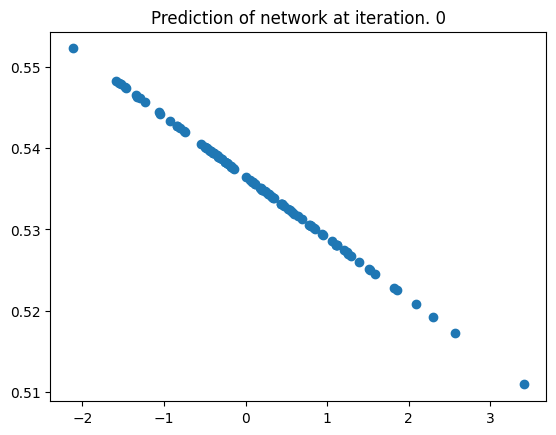

In [44]:
class Line(nn.Module):
    def __init__(self):
        super().__init__()
        self.layer = nn.Linear(1, 1)

    def forward(self, x):
        y = self.layer(x)
        return y
    
line = Line()
x = torch.randn(100, 1)
y = line(x)

plt.title("Prediction of network at iteration. 0")
plt.scatter(to_numpy(x), to_numpy(y))
plt.show()

In [45]:
for n, p in line.named_parameters():
    print(n, p)

layer.weight Parameter containing:
tensor([[-0.0075]], requires_grad=True)
layer.bias Parameter containing:
tensor([0.5364], requires_grad=True)


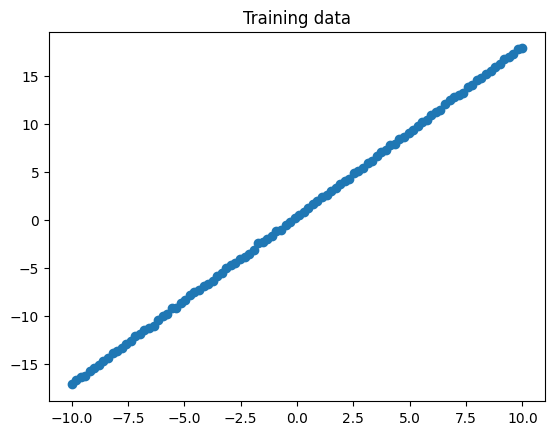

In [46]:
m = np.random.randn()
b = np.random.randn()
x = np.linspace(-10, 10, 100)
noise = np.random.normal(loc=0, scale=0.1, size=100)

y = m*x + b + noise

plt.title("Training data")
plt.scatter(x, y)
plt.show()

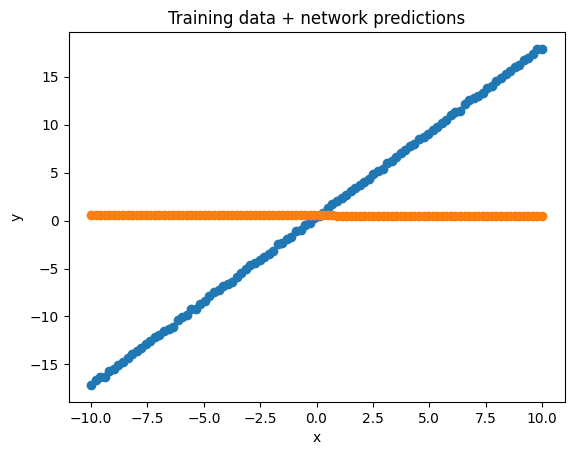

In [47]:
y_hat = line(to_tensor(x))

plt.title("Training data + network predictions")
plt.scatter(x, y, label='Training data')
plt.scatter(x, to_numpy(y_hat), label='Network predictions')
plt.xlabel('x')
plt.ylabel('y')
plt.show()

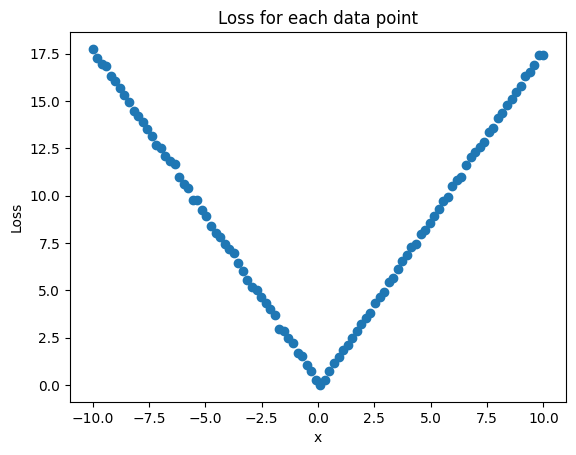

In [48]:
loss = (y_hat - to_tensor(y)).abs()
plt.title("Loss for each data point")
plt.scatter(x, to_numpy(loss))
plt.ylabel("Loss")
plt.xlabel("x")
plt.show()

In [49]:
loss.mean()

tensor(8.9430, grad_fn=<MeanBackward0>)

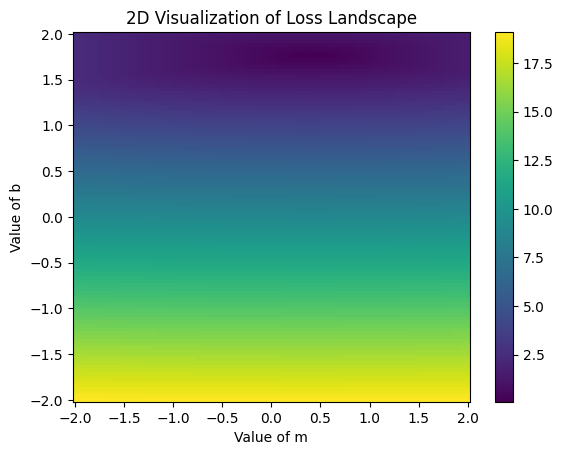

In [50]:
possible_m = np.linspace(-2, 2, 100)
possible_b = np.linspace(-2, 2, 100)
loss = np.empty((
    possible_m.shape[0], 
    possible_b.shape[0]
))

with torch.no_grad():
    for i, m_hat in enumerate(possible_m):
        for j, b_hat in enumerate(possible_b):
            line.layer.weight[0, 0] = m_hat
            line.layer.bias[0] = b_hat
            y_hat = line(to_tensor(x))
            _loss = (y_hat - to_tensor(y)).abs().mean()
            loss[i, j] = _loss

plt.title('2D Visualization of Loss Landscape')
plt.pcolormesh(possible_m, possible_b, loss, shading='auto')
plt.colorbar()
plt.xlabel('Value of m')
plt.ylabel('Value of b')
plt.show()

In [51]:
idx = np.unravel_index(np.argmin(loss, axis=None), loss.shape)
m_hat = possible_m[idx[0]]
b_hat = possible_b[idx[1]]

print(f"Loss minimum of {loss.min():-2f} at \n\t m_hat={m_hat:0.2f}, b_hat={b_hat:-.2f}")
print(f"Actual m, b: \n\t m={m:.2f}, b={b:.2f}")

Loss minimum of 0.086866 at 
	 m_hat=1.76, b_hat=0.38
Actual m, b: 
	 m=1.76, b=0.40


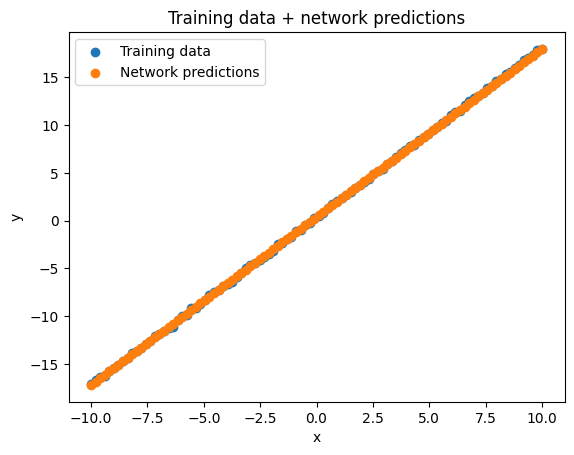

In [52]:
with torch.no_grad():
    line.layer.weight[0, 0] = m_hat
    line.layer.bias[0] = b_hat

    y_hat = line(to_tensor(x))

plt.title("Training data + network predictions")
plt.scatter(x, y, label='Training data')
plt.scatter(x, to_numpy(y_hat), label='Network predictions')
plt.xlabel('x')
plt.ylabel('y')
plt.legend()
plt.show()

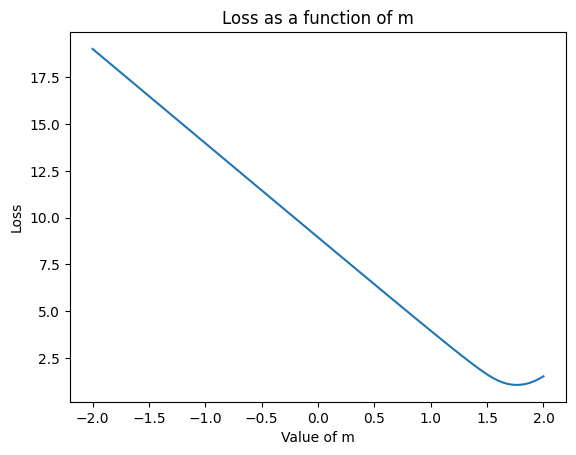

In [53]:
plt.plot(possible_m, loss.mean(axis=1))
plt.xlabel('Value of m')
plt.ylabel('Loss')
plt.title('Loss as a function of m')
plt.show()

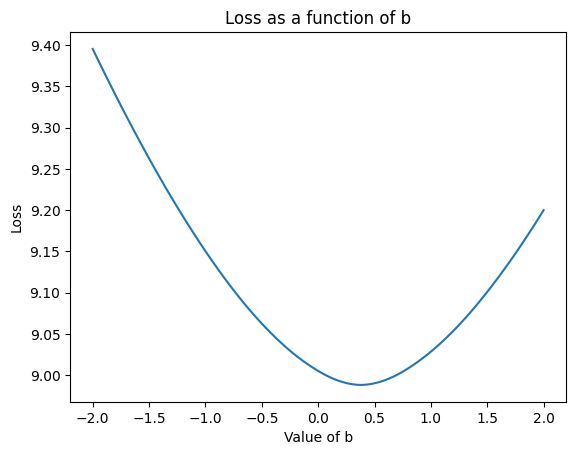

In [54]:
plt.plot(possible_b, loss.mean(axis=0))
plt.xlabel('Value of b')
plt.ylabel('Loss')
plt.title('Loss as a function of b')
plt.show()

In [55]:
line = Line()
with torch.no_grad():
    line.layer.weight[0, 0] = m_hat
    line.layer.bias[0] = b_hat

y_hat = line(to_tensor(x))
_loss = (y_hat - to_tensor(y)).abs().mean()
_loss.backward()

line.layer.weight.grad, line.layer.bias.grad

(tensor([[-0.8747]]), tensor([-0.1000]))

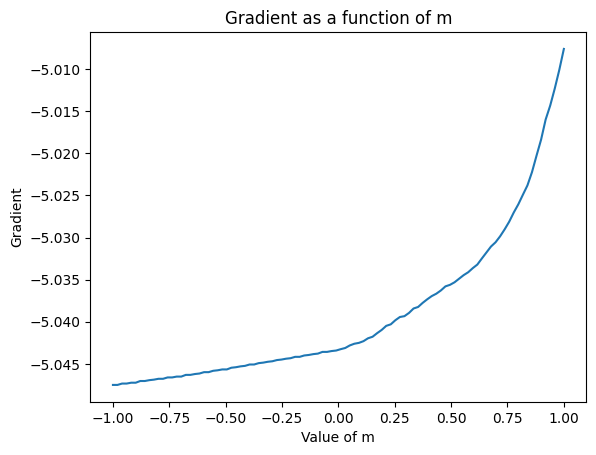

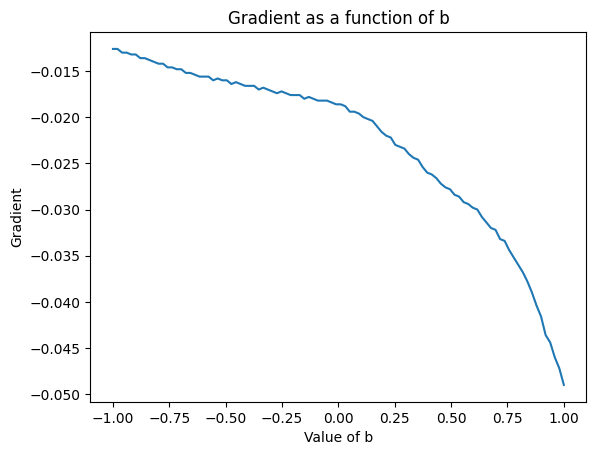

In [56]:
possible_m = np.linspace(-1, 1, 100)
possible_b = np.linspace(-1, 1, 100)
grad_m = np.empty((
    possible_m.shape[0], 
    possible_b.shape[0]
))
grad_b = np.empty((
    possible_m.shape[0], 
    possible_b.shape[0]
))

for i, m_hat in enumerate(possible_m):
    for j, b_hat in enumerate(possible_b):
        line = Line()
        with torch.no_grad():
            line.layer.weight[0, 0] = m_hat
            line.layer.bias[0] = b_hat
        y_hat = line(to_tensor(x))
        _loss = (y_hat - to_tensor(y)).abs().mean()
        _loss.backward()
        
        grad_m[i, j] = line.layer.weight.grad.item()
        grad_b[i, j] = line.layer.bias.grad.item()

plt.plot(possible_m, grad_m.mean(axis=1))
plt.xlabel('Value of m')
plt.ylabel('Gradient')
plt.title('Gradient as a function of m')
plt.show()

plt.plot(possible_b, grad_b.mean(axis=1))
plt.xlabel('Value of b')
plt.ylabel('Gradient')
plt.title('Gradient as a function of b')
plt.show()

In [57]:
N_ITER=100
LEARNING_RATE = 0.01
# initialize line
line = Line()

frames = []
@gif.frame
def plot(i):
    y_hat = line(to_tensor(x))
    plt.figure(dpi=300)
    plt.title(
        f"Training data + network predictions\n"
        f"Learning rate is {LEARNING_RATE}, Iteration {i}")

    plt.scatter(x, y, label='Training data')
    plt.scatter(x, to_numpy(y_hat), label='Network predictions')
    plt.xlabel('x')
    plt.ylabel('y')
    plt.xlim([-10, 10])
    plt.ylim([-20, 20])
    plt.legend()

for i in range(N_ITER):
    line.zero_grad()
    y_hat = line(to_tensor(x))
    _loss = (y_hat - to_tensor(y)).abs().mean()
    _loss.backward()
    
    for n, p in line.named_parameters():
        p.data += - LEARNING_RATE * p.grad
    
    frame = plot(i)
    frames.append(frame)

show_gif(frames)

PermissionError: [Errno 13] Permission denied: 'C:\\Users\\Satyam\\AppData\\Local\\Temp\\tmpolyjnxdw.gif'

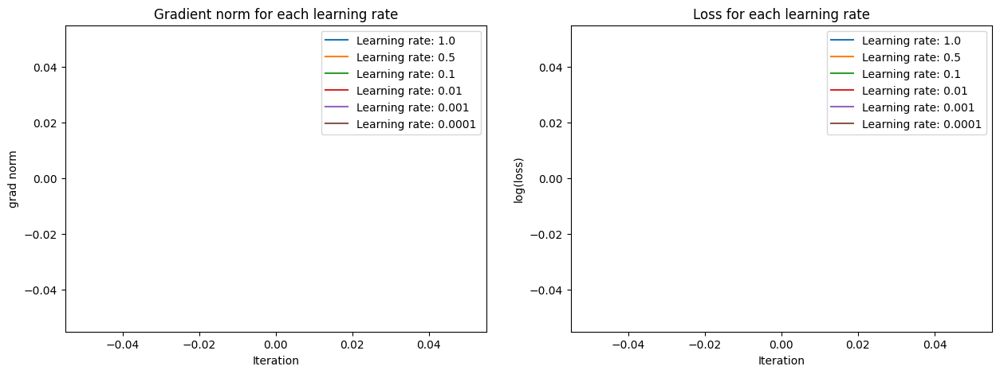

In [61]:
fig, ax = plt.subplots(1, 2, figsize=(15, 5))
LEARNING_RATES = [1.0, 0.5, 0.1, 0.01, 0.001, 0.0001] 
grad_norms = [[] for _ in range(len(LEARNING_RATES))]
losses = [[] for _ in range(len(LEARNING_RATES))]
for j, lr in enumerate(LEARNING_RATES):
    ax[0].plot(grad_norms[j], label=f'Learning rate: {lr}')
    ax[0].legend()
    ax[0].set_xlabel('Iteration')
    ax[0].set_ylabel('grad norm')
    ax[0].set_title('Gradient norm for each learning rate')
    
for j, lr in enumerate(LEARNING_RATES):
    ax[1].plot(np.log10(losses[j]), label=f'Learning rate: {lr}')
    ax[1].legend()
    ax[1].set_xlabel('Iteration')
    ax[1].set_ylabel('log(loss)')
    ax[1].set_title('Loss for each learning rate')
plt.show()

In [62]:
import torch
from torch import nn
import nussl

nussl.utils.seed(0)
to_numpy = lambda x: x.detach().numpy()
to_tensor = lambda x: torch.from_numpy(x).reshape(-1, 1).float()

class Model(nn.Module):
    def __init__(self):
        super().__init__()
    
    def forward(self, data):
        return data

AttributeError: module 'librosa.display' has no attribute 'waveplot'

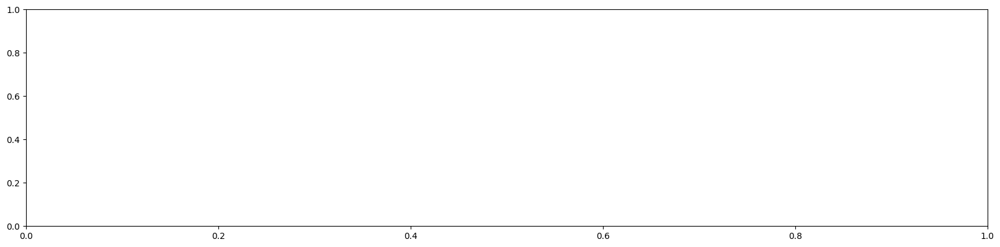

In [63]:
import torch
import nussl
from common import viz
import numpy as np
import matplotlib.pyplot as plt

musdb = nussl.datasets.MUSDB18(download=True)
item = musdb[40]

viz.show_sources(item['sources'])

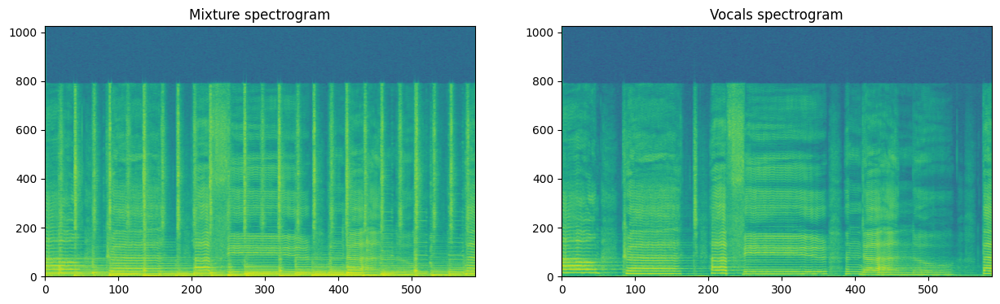

In [64]:
representation = np.abs(item['mix'].stft())
vocals_representation = np.abs(item['sources']['vocals'].stft())

fig, ax = plt.subplots(1, 2, figsize=(15, 4))
ax[0].imshow(20 * np.log10(representation[..., 0]), origin='lower', aspect='auto')
ax[0].set_title('Mixture spectrogram')
ax[1].imshow(20 * np.log10(vocals_representation[..., 0]), origin='lower', aspect='auto')
ax[1].set_title('Vocals spectrogram')
plt.show()

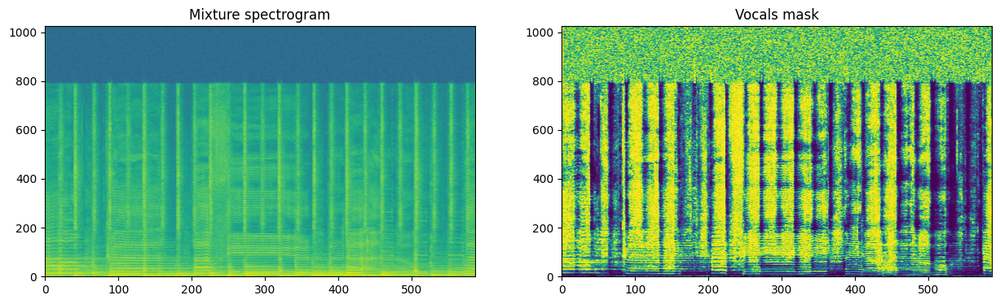

In [65]:
mask = vocals_representation / (np.maximum(vocals_representation, representation) + 1e-8)

fig, ax = plt.subplots(1, 2, figsize=(15, 4))
ax[0].imshow(20 * np.log10(representation[..., 0]), origin='lower', aspect='auto')
ax[0].set_title('Mixture spectrogram')
ax[1].imshow(mask[..., 0], origin='lower', aspect='auto')
ax[1].set_title('Vocals mask')
plt.show()

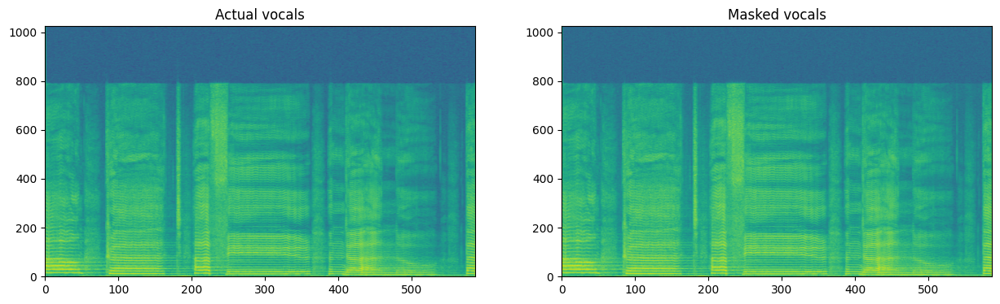

In [67]:
masked = mask * representation
fig, ax = plt.subplots(1, 2, figsize=(15, 4))
ax[0].imshow(20 * np.log10(vocals_representation[..., 0]), origin='lower', aspect='auto')
ax[0].set_title('Actual vocals')
ax[1].imshow(20 * np.log10(masked[..., 0]), origin='lower', aspect='auto')
ax[1].set_title('Masked vocals')
plt.show()

In [68]:
mix_phase = np.angle(item['mix'].stft())
masked_stft = masked * np.exp(1j * mix_phase)
new_signal = nussl.AudioSignal(stft=masked_stft, sample_rate=item['mix'].sample_rate)
new_signal.istft()
new_signal.embed_audio(display=False)

In [69]:
mix_tensor = torch.from_numpy(representation)
mask_tensor = torch.rand_like(mix_tensor.unsqueeze(-1))

# shapes
print(mix_tensor.shape, mask_tensor.shape)

# masking operation:
masked_tensor = mix_tensor.unsqueeze(-1) * mask_tensor

print(masked_tensor.shape)

torch.Size([1025, 587, 2]) torch.Size([1025, 587, 2, 1])
torch.Size([1025, 587, 2, 1])


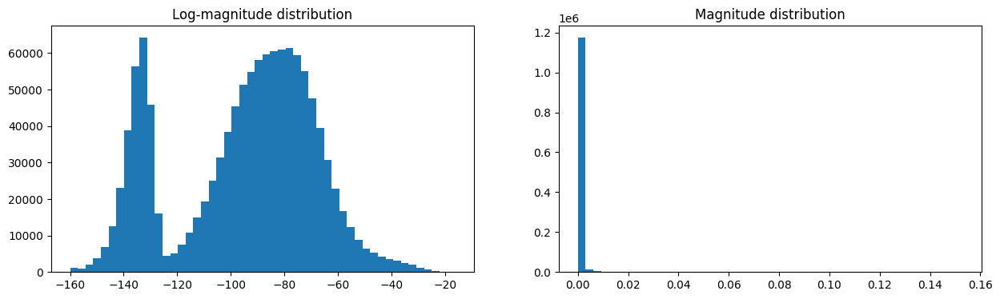

In [70]:
fig, ax = plt.subplots(1, 2, figsize=(15, 4))
ax[0].hist(20 * np.log10(np.maximum(representation, 1e-8)).flatten(), bins=50)
ax[0].set_title('Log-magnitude distribution')
ax[1].hist(representation.flatten(), bins=50)
ax[1].set_title('Magnitude distribution')
plt.show()

In [71]:
from nussl.ml.networks.modules import AmplitudeToDB

amplitude_to_db = AmplitudeToDB()
mix_log_amplitude = amplitude_to_db(mix_tensor)
print(mix_tensor.mean(), mix_log_amplitude.mean())

tensor(0.0004, dtype=torch.float64) tensor(-75.9872, dtype=torch.float64)


In [72]:
mix_tensor.shape

torch.Size([1025, 587, 2])

In [73]:
print("Shape before (nf, nt, nac): ", mix_tensor.shape)
mix_tensor = mix_tensor.permute(1, 0, 2).unsqueeze(0).float()
print("Shape after (nb, nt, nf, nac):", mix_tensor.shape)

Shape before (nf, nt, nac):  torch.Size([1025, 587, 2])
Shape after (nb, nt, nf, nac): torch.Size([1, 587, 1025, 2])


In [74]:
class Model(nn.Module):
    def __init__(self):
        super().__init__()
        
        self.amplitude_to_db = AmplitudeToDB()
    
    def forward(self, data):
        data = self.amplitude_to_db(data)
        return data
    
model = Model()
mix_log_amplitude = model(mix_tensor)

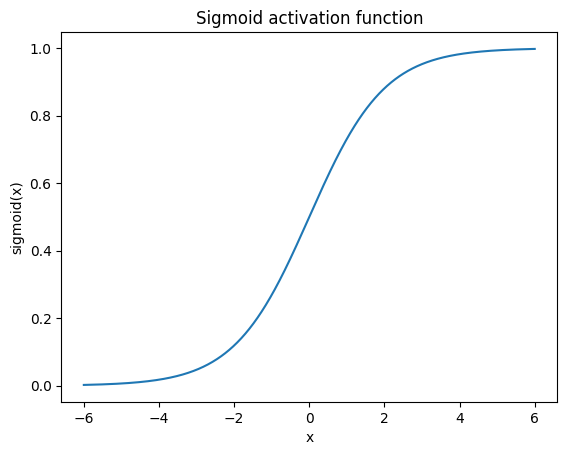

In [75]:
x = torch.linspace(-6, 6, 1000)
y = torch.sigmoid(x)
plt.plot(to_numpy(x), to_numpy(y))
plt.xlabel('x')
plt.ylabel('sigmoid(x)')
plt.title('Sigmoid activation function')
plt.show()

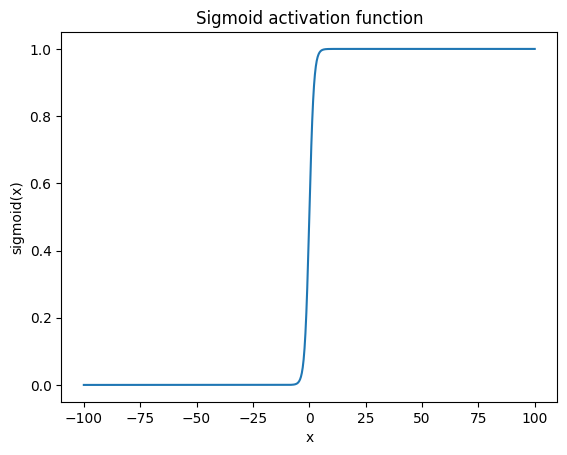

In [76]:
x = torch.linspace(-100, 100, 1000)
y = torch.sigmoid(x)
plt.plot(to_numpy(x), to_numpy(y))
plt.xlabel('x')
plt.ylabel('sigmoid(x)')
plt.title('Sigmoid activation function')
plt.show()

In [77]:
from nussl.ml.networks.modules import BatchNorm

def print_stats(data):
    print(
        f"Shape: {data.shape}\n"
        f"Mean: {data.mean().item()}\n"
        f"Var: {data.var().item()}\n"
    )

input_normalization = BatchNorm(num_features=mix_tensor.shape[2])
mix_log_amplitude = amplitude_to_db(mix_tensor)

print_stats(mix_tensor)
print_stats(mix_log_amplitude)

normalized = input_normalization(mix_log_amplitude)

print_stats(mix_log_amplitude)
print_stats(normalized)

Shape: torch.Size([1, 587, 1025, 2])
Mean: 0.00044009656994603574
Var: 6.760465112165548e-06

Shape: torch.Size([1, 587, 1025, 2])
Mean: -75.98716735839844
Var: 67.525146484375

Shape: torch.Size([1, 587, 1025, 2])
Mean: -75.98716735839844
Var: 67.525146484375

Shape: torch.Size([1, 587, 1025, 2])
Mean: 4.129960018417478e-08
Var: 0.7717075943946838



In [78]:
class Model(nn.Module):
    def __init__(self, num_features):
        super().__init__()
        
        self.amplitude_to_db = AmplitudeToDB()
        self.input_normalization = BatchNorm(num_features)
    
    def forward(self, data):
        data = self.amplitude_to_db(data)
        data = self.input_normalization(data)
        return data

num_features = mix_tensor.shape[2]
model = Model(num_features)
output = model(mix_tensor)

print_stats(mix_tensor)
print_stats(output)

Shape: torch.Size([1, 587, 1025, 2])
Mean: 0.00044009656994603574
Var: 6.760465112165548e-06

Shape: torch.Size([1, 587, 1025, 2])
Mean: 4.129960018417478e-08
Var: 0.7717075943946838



In [79]:
from nussl.ml.networks.modules import RecurrentStack

nb, nt, nf, nac = mix_tensor.shape
recurrent_stack = RecurrentStack(
    nf * nac, 
    hidden_size=50, 
    num_layers=2, 
    bidirectional=True, 
    dropout=0.3
)

output = recurrent_stack(normalized)
print_stats(mix_tensor)
print_stats(output)

Shape: torch.Size([1, 587, 1025, 2])
Mean: 0.00044009656994603574
Var: 6.760465112165548e-06

Shape: torch.Size([1, 587, 100])
Mean: -0.0027888151817023754
Var: 0.11543252319097519



In [80]:
class Model(nn.Module):
    def __init__(self, num_features, num_audio_channels, hidden_size,
                 num_layers, bidirectional, dropout):
        super().__init__()
        
        self.amplitude_to_db = AmplitudeToDB()
        self.input_normalization = BatchNorm(num_features)
        self.recurrent_stack = RecurrentStack(
            num_features * num_audio_channels, hidden_size, 
            num_layers, bool(bidirectional), dropout
        )
    def forward(self, data):
        data = self.amplitude_to_db(data)
        data = self.input_normalization(data)
        data = self.recurrent_stack(data)
        return data

nb, nt, nf, nac = mix_tensor.shape
model = Model(nf, nac, 50, 2, True, 0.3)
output = model(mix_tensor)

print_stats(mix_tensor)
print_stats(output)

Shape: torch.Size([1, 587, 1025, 2])
Mean: 0.00044009656994603574
Var: 6.760465112165548e-06

Shape: torch.Size([1, 587, 100])
Mean: -0.019529923796653748
Var: 0.11988122761249542



In [81]:
from nussl.ml.networks.modules import Embedding

class Model(nn.Module):
    def __init__(self, num_features, num_audio_channels, hidden_size,
                 num_layers, bidirectional, dropout, num_sources, 
                activation='sigmoid'):
        super().__init__()
        
        self.amplitude_to_db = AmplitudeToDB()
        self.input_normalization = BatchNorm(num_features)
        self.recurrent_stack = RecurrentStack(
            num_features * num_audio_channels, hidden_size, 
            num_layers, bool(bidirectional), dropout
        )
        hidden_size = hidden_size * (int(bidirectional) + 1)
        self.embedding = Embedding(num_features, hidden_size, 
                                   num_sources, activation, 
                                   num_audio_channels)
        
    def forward(self, data):
        data = self.amplitude_to_db(data)
        data = self.input_normalization(data)
        data = self.recurrent_stack(data)
        data = self.embedding(data)
        return data

nb, nt, nf, nac = mix_tensor.shape
model = Model(nf, nac, 50, 2, True, 0.3, 1, 'sigmoid')
output = model(mix_tensor)

print_stats(mix_tensor)
print_stats(output)

Shape: torch.Size([1, 587, 1025, 2])
Mean: 0.00044009656994603574
Var: 6.760465112165548e-06

Shape: torch.Size([1, 587, 1025, 2, 1])
Mean: 0.5000264644622803
Var: 0.0006248863646760583



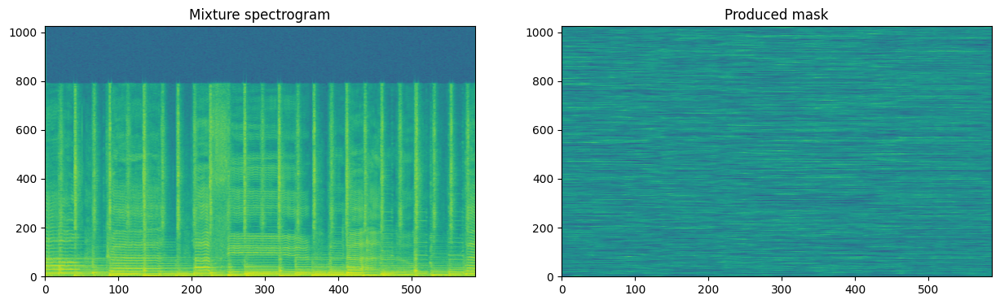

In [82]:
mask = to_numpy(output[0, ..., 0])

fig, ax = plt.subplots(1, 2, figsize=(15, 4))
ax[0].imshow(20 * np.log10(representation[..., 0]), origin='lower', aspect='auto')
ax[0].set_title('Mixture spectrogram')
ax[1].imshow(mask[..., 0].T, origin='lower', aspect='auto')
ax[1].set_title('Produced mask')
plt.show()

In [83]:
from nussl.ml.networks.modules import Embedding

class Model(nn.Module):
    def __init__(self, num_features, num_audio_channels, hidden_size,
                 num_layers, bidirectional, dropout, num_sources, 
                activation='sigmoid'):
        super().__init__()
        
        self.amplitude_to_db = AmplitudeToDB()
        self.input_normalization = BatchNorm(num_features)
        self.recurrent_stack = RecurrentStack(
            num_features * num_audio_channels, hidden_size, 
            num_layers, bool(bidirectional), dropout
        )
        hidden_size = hidden_size * (int(bidirectional) + 1)
        self.embedding = Embedding(num_features, hidden_size, 
                                   num_sources, activation, 
                                   num_audio_channels)
        
    def forward(self, data):
        mix_magnitude = data # save for masking
        
        data = self.amplitude_to_db(mix_magnitude)
        data = self.input_normalization(data)
        data = self.recurrent_stack(data)
        mask = self.embedding(data)
        
        estimates = mix_magnitude.unsqueeze(-1) * mask
        return estimates

nb, nt, nf, nac = mix_tensor.shape
model = Model(nf, nac, 50, 2, True, 0.3, 1, 'sigmoid')
output = model(mix_tensor)

print_stats(mix_tensor)
print_stats(output)

Shape: torch.Size([1, 587, 1025, 2])
Mean: 0.00044009656994603574
Var: 6.760465112165548e-06

Shape: torch.Size([1, 587, 1025, 2, 1])
Mean: 0.0002198376605520025
Var: 1.6881291458048509e-06



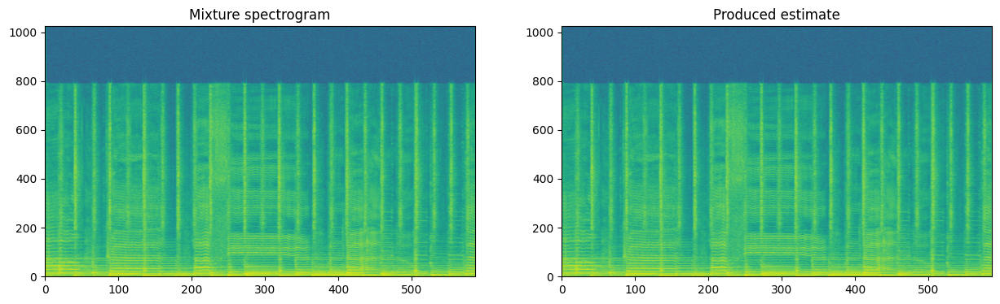

In [84]:
estimate = to_numpy(output[0, ..., 0])

fig, ax = plt.subplots(1, 2, figsize=(15, 4))
ax[0].imshow(20 * np.log10(representation[..., 0]), origin='lower', aspect='auto')
ax[0].set_title('Mixture spectrogram')
ax[1].imshow(20 * np.log10(estimate[..., 0].T), origin='lower', aspect='auto')
ax[1].set_title('Produced estimate')
plt.show()

In [85]:
from nussl.ml.networks.modules import Embedding

class Model(nn.Module):
    def __init__(self, num_features, num_audio_channels, hidden_size,
                 num_layers, bidirectional, dropout, embedding_size, 
                activation=['sigmoid', 'unit_norm']):
        super().__init__()
        
        self.amplitude_to_db = AmplitudeToDB()
        self.input_normalization = BatchNorm(num_features)
        self.recurrent_stack = RecurrentStack(
            num_features * num_audio_channels, hidden_size, 
            num_layers, bool(bidirectional), dropout
        )
        hidden_size = hidden_size * (int(bidirectional) + 1)
        self.embedding = Embedding(num_features, hidden_size, 
                                   embedding_size, activation, 
                                   num_audio_channels)
        
    def forward(self, data):
        mix_magnitude = data # save for masking
        
        data = self.amplitude_to_db(mix_magnitude)
        data = self.input_normalization(data)
        data = self.recurrent_stack(data)
        mask = self.embedding(data)
        
        estimates = mix_magnitude.unsqueeze(-1) * mask
        return estimates

nb, nt, nf, nac = mix_tensor.shape
model = Model(nf, nac, 50, 2, True, 0.3, 20, ['sigmoid', 'unit_norm'])
output = model(mix_tensor)

print_stats(mix_tensor)
print_stats(output)

Shape: torch.Size([1, 587, 1025, 2])
Mean: 0.00044009656994603574
Var: 6.760465112165548e-06

Shape: torch.Size([1, 587, 1025, 2, 20])
Mean: 9.840189159149304e-05
Var: 3.380243072115263e-07



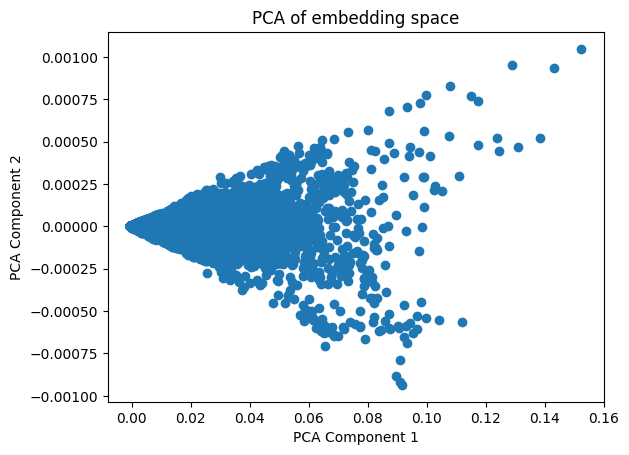

In [86]:
from sklearn.decomposition import PCA

np_output = to_numpy(output.reshape(-1, 20))
pca = PCA(n_components=2)
pca_output = pca.fit_transform(np_output)

plt.scatter(pca_output[:, 0], pca_output[:, 1])
plt.xlabel('PCA Component 1')
plt.ylabel('PCA Component 2')
plt.title('PCA of embedding space')
plt.show()

In [87]:
from nussl.ml.networks.modules import STFT

stft = STFT(2048, hop_length=512)
mix_audio = torch.from_numpy(item['mix'].audio_data).unsqueeze(0).float()
scipy_mag = np.abs(item['mix'].stft())
torch_stft = stft(mix_audio, direction='transform')
print(torch_stft.shape, scipy_mag.shape)

torch.Size([1, 587, 2050, 2]) (1025, 587, 2)


torch.Size([1, 587, 2, 1025, 2])
torch.Size([1, 587, 1025, 2])


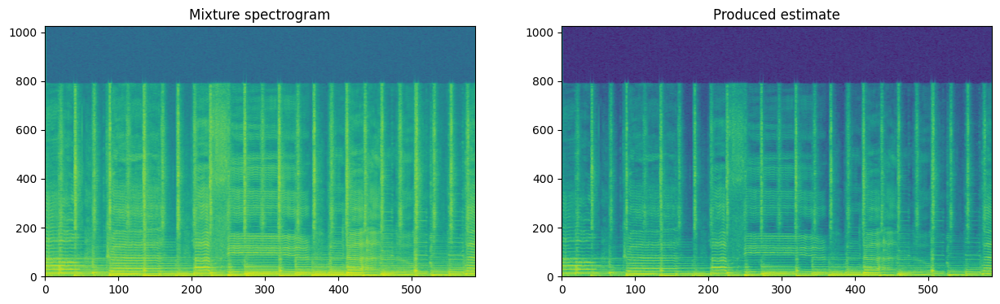

In [88]:
nb, nt, nf, nac = torch_stft.shape
# Stack the real/imag along the second to last axis
torch_stft = torch_stft.reshape(nb, nt, 2, -1, nac)
print(torch_stft.shape)
# Compute the magnitude
torch_mag, torch_phase = torch_stft[:, :, 0, ...], torch_stft[:, :, 1, ...]
print(torch_mag.shape)

fig, ax = plt.subplots(1, 2, figsize=(15, 4))
ax[0].imshow(20 * np.log10(scipy_mag[..., 0]), origin='lower', aspect='auto')
ax[0].set_title('Mixture spectrogram')
ax[1].imshow(20 * np.log10(torch_mag[0, ..., 0].T), origin='lower', aspect='auto')
ax[1].set_title('Produced estimate')
plt.show()

torch.Size([2, 587, 2, 1025, 1])
torch.Size([2, 587, 1025, 1])


C:\Users\Satyam\AppData\Local\Temp\ipykernel_18280\2957244854.py:12: RuntimeWarning: invalid value encountered in log10
  ax[1].imshow(20 * np.log10(torch_mag[0, ..., 0].T), origin='lower', aspect='auto')


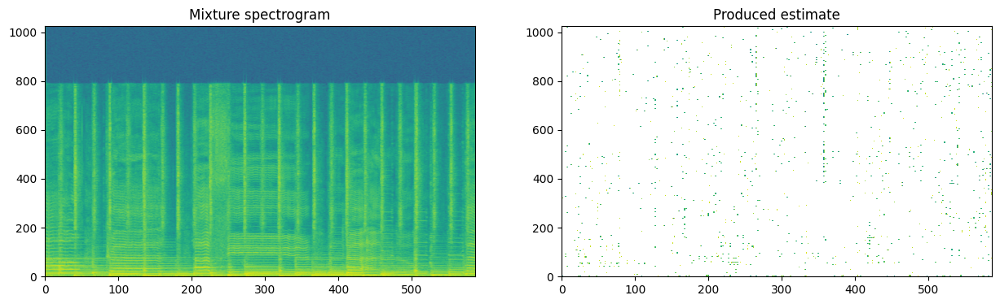

In [114]:
nb, nt, nf, idk, nac= torch_stft.shape
# Stack the real/imag along the second to last axis
torch_stft = torch_stft.reshape(nb, nt, 2, -1, nac)
print(torch_stft.shape)
# Compute the magnitude
torch_mag, torch_phase = torch_stft[:, :, 0, ...], torch_stft[:, :, 1, ...]
print(torch_mag.shape)

fig, ax = plt.subplots(1, 2, figsize=(15, 4))
ax[0].imshow(20 * np.log10(scipy_mag[..., 0]), origin='lower', aspect='auto')
ax[0].set_title('Mixture spectrogram')
ax[1].imshow(20 * np.log10(torch_mag[0, ..., 0].T), origin='lower', aspect='auto')
ax[1].set_title('Produced estimate')
plt.show()

In [113]:
np.abs(torch_mag[0, ...,].permute(1, 0, 2).numpy() - scipy_mag).max()

3.267557810524979

In [115]:
from nussl.ml.networks.modules import Embedding

class Model(nn.Module):
    def __init__(self, num_features, num_audio_channels, hidden_size,
                 num_layers, bidirectional, dropout, embedding_size, 
                 num_filters, hop_length, window_type='sqrt_hann', # New STFT parameters
                 activation=['sigmoid', 'unit_norm']):
        super().__init__()
        
        self.stft = STFT(
            num_filters, 
            hop_length=hop_length, 
            window_type=window_type
        )
        self.amplitude_to_db = AmplitudeToDB()
        self.input_normalization = BatchNorm(num_features)
        self.recurrent_stack = RecurrentStack(
            num_features * num_audio_channels, hidden_size, 
            num_layers, bool(bidirectional), dropout
        )
        hidden_size = hidden_size * (int(bidirectional) + 1)
        self.embedding = Embedding(num_features, hidden_size, 
                                   embedding_size, activation, 
                                   num_audio_channels)
        
    def forward(self, data):
        # Take STFT inside model
        mix_stft = self.stft(data, direction='transform')
        nb, nt, nf, nac = mix_stft.shape
        # Stack the mag/phase along the second to last axis
        mix_stft = mix_stft.reshape(nb, nt, 2, -1, nac)
        mix_magnitude = mix_stft[:, :, 0, ...] # save for masking
        mix_phase = mix_stft[:, :, 1, ...] # save for reconstruction
        
        data = self.amplitude_to_db(mix_magnitude)
        data = self.input_normalization(data)
        data = self.recurrent_stack(data)
        mask = self.embedding(data)
        
        # Mask the mixture spectrogram
        estimates = mix_magnitude.unsqueeze(-1) * mask
        
        # Recombine estimates with mixture phase
        mix_phase = mix_phase.unsqueeze(-1).expand_as(estimates)
        estimates = torch.cat([estimates, mix_phase], dim=2)
        estimate_audio = self.stft(estimates, direction='inverse')
        
        return estimate_audio

model = Model(1025, 2, 50, 2, True, 0.3, 2, 2048, 512)
output = model(mix_audio)

print_stats(mix_tensor)
print_stats(output)

Shape: torch.Size([1, 587, 1025, 2])
Mean: 0.00044009656994603574
Var: 6.760465112165548e-06

Shape: torch.Size([1, 2, 300032, 2])
Mean: 1.8166794689022936e-05
Var: 0.005775966215878725



In [116]:
for i in range(output.shape[-1]):
    source = output[0, ..., i]
    nussl.AudioSignal(audio_data_array=to_numpy(source), sample_rate=44100).embed_audio()

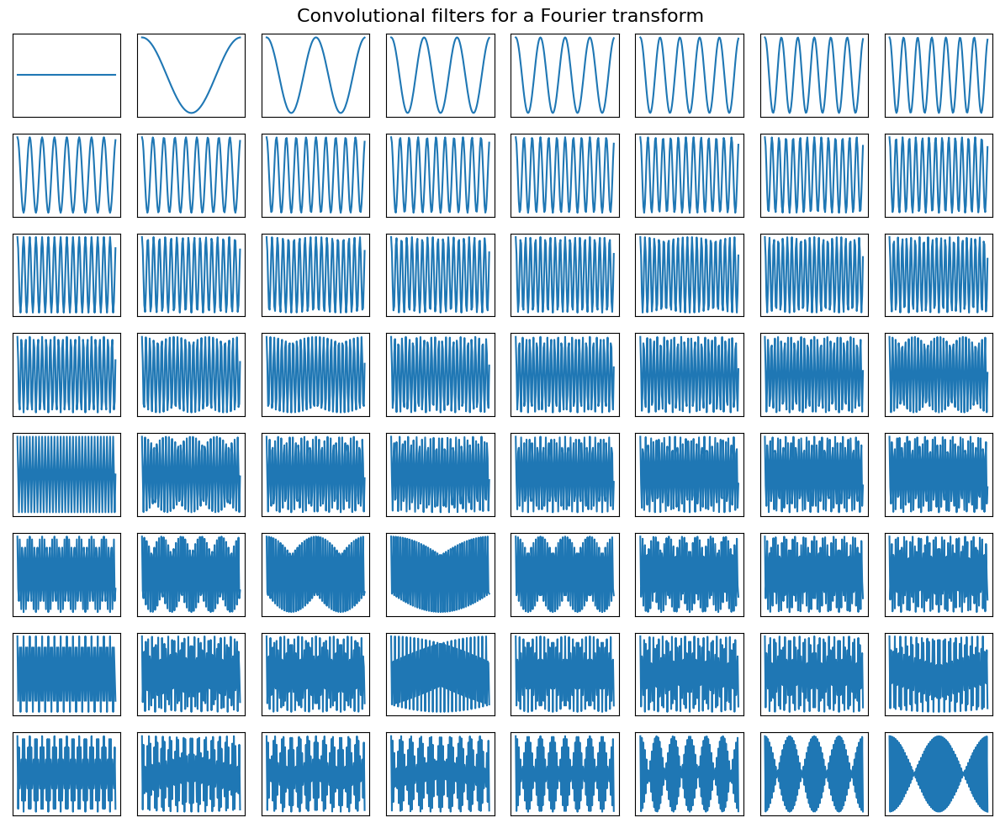

In [117]:
filter_length = 128

fig, ax = plt.subplots(8, 8, figsize=(12, 10))
ax = ax.flatten()

fourier_basis = torch.fft.rfft(
    torch.eye(filter_length)
)
cutoff = 1 + filter_length // 2
fourier_basis = torch.cat([
    torch.real(fourier_basis[:, :cutoff]),
    torch.imag(fourier_basis[:, :cutoff])
], dim=1)
fourier_basis = fourier_basis.float()

for i in range(ax.shape[-1]):
    ax[i].plot(to_numpy(fourier_basis)[:, i])
    ax[i].set_xticks([])
    ax[i].set_yticks([])
plt.suptitle('Convolutional filters for a Fourier transform', fontsize=16)
plt.tight_layout()
plt.show()

In [118]:
from nussl.ml.networks.modules import LearnedFilterBank

class Model(nn.Module):
    def __init__(self, num_features, num_audio_channels, hidden_size,
                 num_layers, bidirectional, dropout, embedding_size, 
                 num_filters, hop_length, window_type='rectangular', # Learned filterbank parameters
                 activation=['sigmoid', 'unit_norm']):
        super().__init__()
        
        self.representation = LearnedFilterBank(
            num_filters, 
            hop_length=hop_length, 
            window_type=window_type
        )
        self.amplitude_to_db = AmplitudeToDB()
        self.input_normalization = BatchNorm(num_features)
        self.recurrent_stack = RecurrentStack(
            num_features * num_audio_channels, hidden_size, 
            num_layers, bool(bidirectional), dropout
        )
        hidden_size = hidden_size * (int(bidirectional) + 1)
        self.embedding = Embedding(num_features, hidden_size, 
                                   embedding_size, activation, 
                                   num_audio_channels)
        
    def forward(self, data):
        # Take STFT inside model
        mix_repr = self.representation(data, direction='transform')
        
        data = self.amplitude_to_db(mix_repr)
        data = self.input_normalization(data)
        data = self.recurrent_stack(data)
        mask = self.embedding(data)
        
        # Mask the mixture spectrogram
        estimates = mix_repr.unsqueeze(-1) * mask
        
        # Recombine estimates with mixture phase
        estimate_audio = self.representation(estimates, direction='inverse')
        
        return estimate_audio

model = Model(128, 2, 50, 2, True, 0.3, 2, 128, 32)
output = model(mix_audio)

print_stats(mix_tensor)
print_stats(output)

Shape: torch.Size([1, 587, 1025, 2])
Mean: 0.00044009656994603574
Var: 6.760465112165548e-06

Shape: torch.Size([1, 2, 300032, 2])
Mean: 5.334737943485379e-05
Var: 25.83353042602539



In [119]:
%%capture
from common import data, viz
import nussl
# Prepare MUSDB
data.prepare_musdb('~/.nussl/tutorial/')

In [120]:
stft_params = nussl.STFTParams(window_length=512, hop_length=128, window_type='sqrt_hann')
fg_path = "~/.nussl/tutorial/train"
train_data = data.on_the_fly(stft_params, transform=None, fg_path=fg_path, num_mixtures=1000, coherent_prob=1.0)

ValueError: Invalid file_type. Must be one of []